In [15]:
import os
import glob,pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
import librosa as lr
from scipy import signal

In [16]:
os.listdir(path='./speech-emotion-recognition-ravdess-data')
def getListOfFiles(dirName):
    listOfFile=os.listdir(dirName)
    allFiles=list()
    for entry in listOfFile:
        fullPath=os.path.join(dirName, entry)
        if os.path.isdir(fullPath):
            allFiles=allFiles + getListOfFiles(fullPath)
        else:
            allFiles.append(fullPath)
    return allFiles

dirName = './speech-emotion-recognition-ravdess-data'
listOfFiles = getListOfFiles(dirName)
len(listOfFiles)

1440

In [ ]:
import speech_recognition as sr
r=sr.Recognizer()
for file in range(0 , len(listOfFiles) , 1):
    with sr.AudioFile(listOfFiles[file]) as source:
        audio = r.listen(source)
        try:
            text = r.recognize_google(audio)
            print(text)
        except:
            print('error')

talking by the door
is it talking by the door
dog sitting by the door
talk to Siri why the door
error
error
error
dog sitting by the door
change your talking by the door
kids talking by the door
dogs sitting by the door
sitting by the
kids talking by the door
talking by the door
dog sitting by the door
error
talking by the door
error
sitting by the door
error
kids talking by the door
khesa talking by the door
error


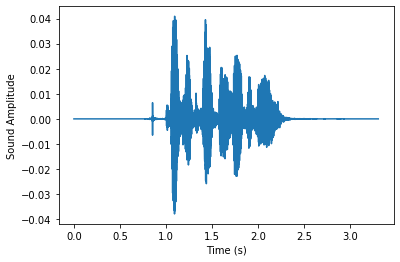

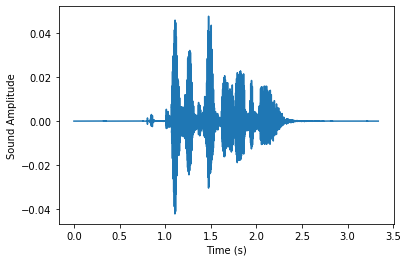

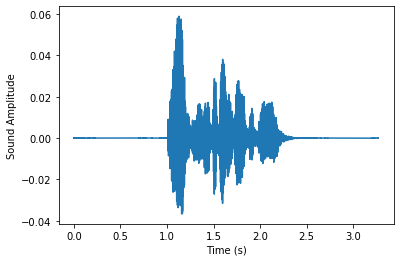

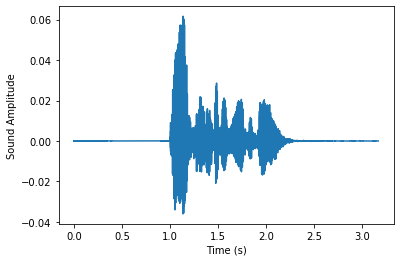

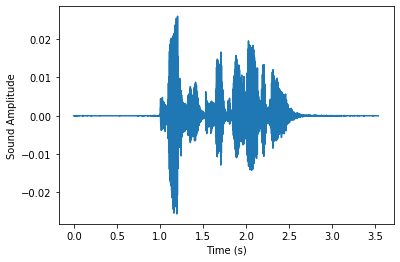

...

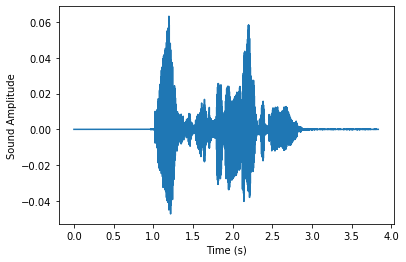

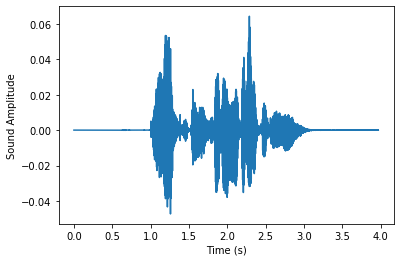

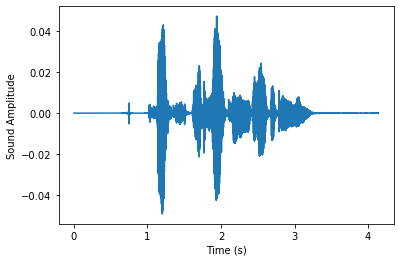

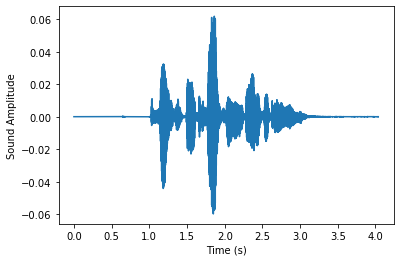

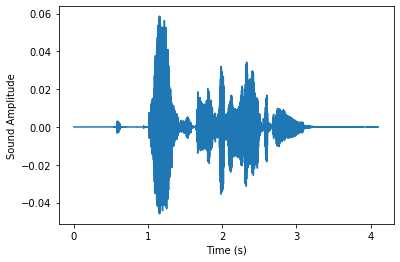

In [ ]:
for file in range(0 , len(listOfFiles) , 1):
    audio , sfreq = lr.load(listOfFiles[file])
    time = np.arange(0 , len(audio)) / sfreq
    
    fig ,ax = plt.subplots()
    ax.plot(time , audio)
    ax.set(xlabel = 'Time (s)' , ylabel = 'Sound Amplitude')
    plt.show()
    
#PLOT THE spectrogram
for file in range(0 , len(listOfFiles) , 1):
    sample_rate , samples = wavfile.read(listOfFiles[file])
    frequencies , times, spectrogram = signal.spectrogram(samples, sample_rate) 
    plt.pcolormesh(times, frequencies, spectrogram)
    plt.imshow(spectrogram)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.show()

In [3]:
#Next Step is In-Depth Visualisation of Audio Fiels and its certain features to plot for.
#They are the Plotting Functions to be called later. 
def plot_signals(signals):
    fig , axes = plt.subplots(nrows=2, ncols=5,sharex =False , sharey=True, figsize=(20,5))
    fig.suptitle('Time Series' , size=16)
    i=0
    for x in range(2):
        for y in range(5):
            axes[x,y].set_title(list(signals.keys())[i])
            axes[x,y].plot(list(signals.values())[i])
            axes[x,y].get_xaxis().set_visible(False)
            axes[x,y].get_yaxis().set_visible(False)
            i +=1

def plot_fft(fft):
    fig , axes = plt.subplots(nrows=2, ncols=5,sharex =False , sharey=True, figsize=(20,5))
    fig.suptitle('Fourier Transform' , size=16)
    i=0
    for x in range(2):
        for y in range(5):
            data = list(fft.values())[i]
            Y,freq = data[0] , data[1]
            axes[x,y].set_title(list(fft.keys())[i])
            axes[x,y].plot(freq , Y)
            axes[x,y].get_xaxis().set_visible(False)
            axes[x,y].get_yaxis().set_visible(False)
            i +=1
    
def plot_fbank(fbank):
    fig , axes = plt.subplots(nrows=2, ncols=5,sharex =False , sharey=True, figsize=(20,5))
    fig.suptitle('Filter Bank Coefficients' , size=16)
    i=0
    for x in range(2):
        for y in range(5):
            axes[x,y].set_title(list(fbank.keys())[i])
            axes[x,y].imshow(list(fbank.values())[i],cmap='hot', interpolation = 'nearest')
            axes[x,y].get_xaxis().set_visible(False)
            axes[x,y].get_yaxis().set_visible(False)
            i +=1
def plot_mfccs(mfccs):
    fig , axes = plt.subplots(nrows=2, ncols=5,sharex =False , sharey=True, figsize=(20,5))
    fig.suptitle('Mel Frequency Capstrum  Coefficients' , size=16)
    i=0
    for x in range(2):
        for y in range(5):
            axes[x,y].set_title(list(mfccs.keys())[i])
            axes[x,y].imshow(list(mfccs.values())[i],cmap='hot', interpolation = 'nearest')
            axes[x,y].get_xaxis().set_visible(False)
            axes[x,y].get_yaxis().set_visible(False)
            i +=1

def calc_fft(y,rate):
    n = len(y)
    freq = np.fft.rfftfreq(n , d= 1/rate)
    Y= abs(np.fft.rfft(y)/n)
    return(Y,freq)

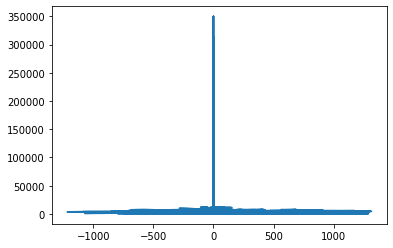

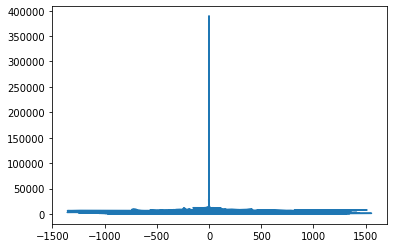

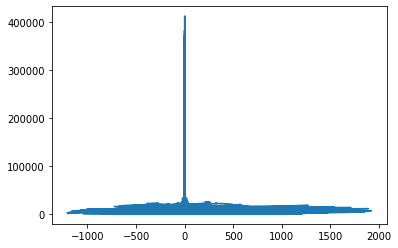

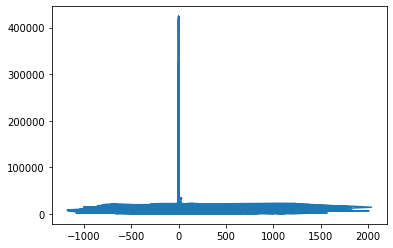

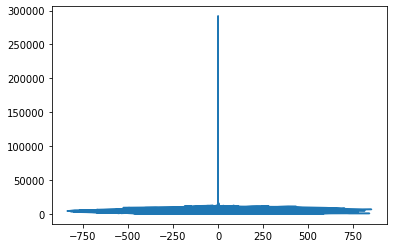

...

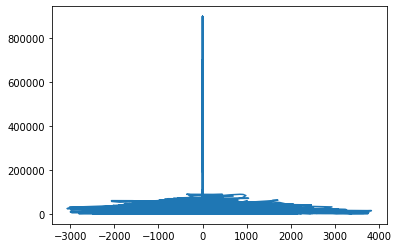

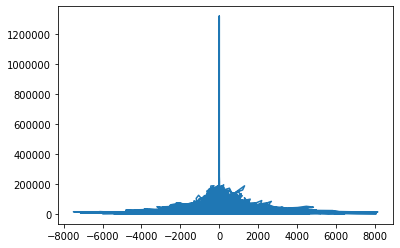

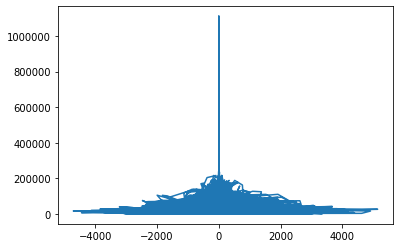

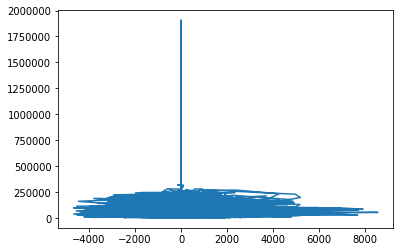

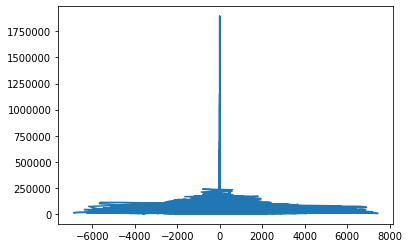

NameError: name 'envelope' is not defined

In [5]:
import matplotlib.pyplot as plt
from scipy.io import wavfile as wav
from scipy.fftpack import fft
import numpy as np
for file in range(0 , len(listOfFiles) , 1):
    rate, data = wav.read(listOfFiles[file])
    fft_out = fft(data)
    %matplotlib inline
    plt.plot(data, np.abs(fft_out))
    plt.show()
    
signals={}
fft={}
fbank={}
mfccs={}
# load data
for file in range(0 , len(listOfFiles) , 1):
    signal,rate =lr.load(listOfFiles[file] , sr=44100)
    mask = envelope(signal , rate , 0.0005)
    signals[file] = signal
    fft[file] = calc_fft(signal , rate)
    
    bank = logfbank(signal[:rate] , rate , nfilt = 26, nfft = 1103).T
    fbank[file] = bank
    mel = mfcc(signal[:rate] , rate , numcep =13 , nfilt = 26 , nfft=1103).T
    mfccs[file]=mel



In [ ]:
plot_signals(signals)
fig.suptitle('Time Series' , size=16)
plt.show()

In [ ]:
plot_fft(fft)
plt.show()

In [ ]:
plot_fbank(fbank)
plt.show()

In [ ]:
plot_mfccs(mfccs)
plt.show()

In [4]:
import soundfile as sf
from sklearn.neural_network import MLPClassifier
def extract_feature(file_name,mfcc,chroma,mel):
    with sf.SoundFile(file_name) as sound_file:
        X=sound_file.read(dtype="float32")
        sample_rate=sound_file.samplerate
        if chroma:
            stft=np.abs(lr.stft(X))
            result=np.array([])
        if mfcc:
            mfccs=np.mean(lr.feature.mfcc(y=X,sr=sample_rate,n_mfcc=40 ).T , axis=0)
            result=np.hstack((result,mfccs))
        if chroma:
            chroma=np.mean(lr.feature.chroma_stft(S=stft,sr=sample_rate).T,axis=0)
            result=np.hstack((result,chroma))
        if mel:
            mel=np.mean(lr.feature.melspectrogram(X,sr=sample_rate).T,axis=0)
            result=np.hstack((result,mel))
    return result
emotions={"01":"Neutral",
          "02":"Calm",
          "03":"Happy",
         "04":"Sad",
          "05":"Angry",
          "06":"Fearful",
          "07":"Disgust",
          "08":"Surprised"}
observed_emotions=["Calm","Happy","Fearful","Disgust"]

In [5]:

from sklearn.model_selection import train_test_split
def load_data(test_size=0.2):
    x,y=[],[]
    answer = 0
    for file in glob.glob(r'C:\Users\HP\Downloads\speech-emotion-recognition-ravdess-data\\Actor_*\\*.wav'):
        file_name=os.path.basename(file)
        emotion=emotions[file_name.split("-")[2]]
        if emotion not in observed_emotions:
            answer += 1
            continue
        feature=extract_feature(file, mfcc=True, chroma=True, mel=True)
        x.append(feature)
        y.append(emotion)
    return train_test_split(np.array(x), y, test_size=test_size, random_state=9)

In [6]:
x_train,x_test,y_train,y_test=load_data(test_size=0.25)

In [7]:
print((x_train.shape[0], x_test.shape[0]))
#Get the number of features extracted
print(f'Features extracted: {x_train.shape[1]}')

(576, 192)
Features extracted: 180


In [8]:
model=MLPClassifier(alpha=0.01, batch_size=256, epsilon=1e-08, hidden_layer_sizes=(300,), learning_rate='adaptive', max_iter=500)

In [9]:
model.fit(x_train,y_train)

MLPClassifier(activation='relu', alpha=0.01, batch_size=256, beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(300,), learning_rate='adaptive',
              learning_rate_init=0.001, max_fun=15000, max_iter=500,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [10]:
y_pred=model.predict(x_test)
y_pred

array(['Happy', 'Fearful', 'Happy', 'Happy', 'Disgust', 'Calm', 'Disgust',
       'Disgust', 'Disgust', 'Happy', 'Happy', 'Disgust', 'Fearful',
       'Happy', 'Disgust', 'Happy', 'Calm', 'Disgust', 'Disgust',
       'Disgust', 'Calm', 'Disgust', 'Disgust', 'Calm', 'Happy', 'Happy',
       'Disgust', 'Happy', 'Fearful', 'Fearful', 'Happy', 'Disgust',
       'Happy', 'Fearful', 'Happy', 'Calm', 'Calm', 'Fearful', 'Calm',
       'Disgust', 'Happy', 'Calm', 'Calm', 'Calm', 'Disgust', 'Calm',
       'Disgust', 'Disgust', 'Calm', 'Happy', 'Fearful', 'Fearful',
       'Fearful', 'Fearful', 'Happy', 'Fearful', 'Disgust', 'Happy',
       'Calm', 'Calm', 'Disgust', 'Calm', 'Disgust', 'Calm', 'Disgust',
       'Calm', 'Calm', 'Disgust', 'Disgust', 'Happy', 'Fearful',
       'Fearful', 'Fearful', 'Fearful', 'Fearful', 'Disgust', 'Fearful',
       'Happy', 'Fearful', 'Fearful', 'Disgust', 'Calm', 'Fearful',
       'Calm', 'Disgust', 'Disgust', 'Disgust', 'Happy', 'Happy',
       'Fearful', 'Disgus

In [11]:
from sklearn.metrics import accuracy_score
accuracy=accuracy_score(y_true=y_test,y_pred=y_pred)
print("Accuracy : {:.2f}%".format(accuracy*100))

Accuracy : 80.73%


In [12]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        Calm       0.94      0.84      0.89        57
     Disgust       0.79      0.85      0.82        48
     Fearful       0.74      0.76      0.75        37
       Happy       0.75      0.76      0.75        50

    accuracy                           0.81       192
   macro avg       0.80      0.80      0.80       192
weighted avg       0.81      0.81      0.81       192



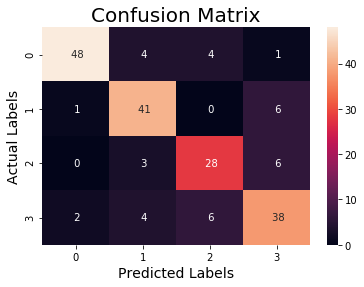

In [13]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm=confusion_matrix(y_test,y_pred)
df_cm=pd.DataFrame(cm)
sns.heatmap(df_cm,annot=True,fmt=" ")
plt.title("Confusion Matrix" , size=20)
plt.xlabel("Predicted Labels" ,size=14)
plt.ylabel("Actual Labels", size=14)
plt.show()

In [14]:
file=r"C:\Users\HP\Downloads\speech-emotion-recognition-ravdess-data\Actor_10\03-01-01-01-01-01-10.wav"
feature=extract_feature(file,mfcc=True,chroma=True,mel=True)
y_pre=model.predict([feature])
print(y_pre)

['Happy']


In [ ]:
import webbrowser
if y_pre[0]=="Calm":
    webbrowser.open("https://www.youtube.com/watch?v=CcsUYu0PVxY")
if y_pre[0]=="Neutral":
    webbrowser.open("https://www.youtube.com/watch?v=OKKr_hzWKLI")
if y_pre[0]=="Happy":
    webbrowser.open("https://www.youtube.com/watch?v=1W9YCSLKf-0")
if y_pre[0]=="Sad":
    webbrowser.open("youtube.com/watch?v=ch0Mf5Y0vzE")
if y_pre[0]=="Angry":
    webbrowser.open("https://www.youtube.com/watch?v=1W9YCSLKf-0")
if y_pre[0]=="Fearful":
    webbrowser.open("https://www.youtube.com/watch?v=TX3eyOp-wgs")